In [ ]:
import os
import numpy as np
import pandas as pd
import plotly.express as px

from keras.models import Model
from keras.layers import Input, Conv2D, BatchNormalization, MaxPool2D, Activation, Flatten, Dense, Dropout, concatenate
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.np_utils import to_categorical
from keras.layers import Dense, GlobalAveragePooling2D, Reshape, Resizing
from keras.applications.inception_v3 import InceptionV3

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE

from cv2 import merge
from tqdm import tqdm

obj_categories = [
    'T-shirt/top', 'Trouser', 'Pullover', 'Dress',
    'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot'
]
colors = plt.cm.rainbow(np.linspace(0, 1, 10))

In [ ]:
data_train = pd.read_csv('fashion-mnist_train.csv')
X_full = data_train.iloc[:, 1:]
y_full = data_train.iloc[:, :1]

x_train, x_test, y_train, y_test = train_test_split(X_full, y_full, test_size=0.3)

x_train = x_train.values.reshape(-1, 28, 28, 1).astype('float32') / 255.
x_test = x_test.values.reshape(-1, 28, 28, 1).astype('float32') / 255.
y_train = y_train.values.astype('int')
y_test = y_test.values.astype('int')

print('Training', x_train.shape, x_train.max())
print('Testing', x_test.shape, x_test.max())

Training (42000, 28, 28, 1) 1.0
Testing (18000, 28, 28, 1) 1.0


In [ ]:
# reorganize by groups
train_groups = [x_train[np.where(y_train == i)[0]] for i in np.unique(y_train)]
test_groups = [x_test[np.where(y_test == i)[0]] for i in np.unique(y_train)]

print('train groups:', [x.shape[0] for x in train_groups])
print('test groups:', [x.shape[0] for x in test_groups])

train groups: [4223, 4220, 4230, 4192, 4140, 4184, 4248, 4156, 4229, 4178]
test groups: [1777, 1780, 1770, 1808, 1860, 1816, 1752, 1844, 1771, 1822]


In [ ]:
def gen_random_batch(in_groups, batch_halfsize=8):
    out_img_a, out_img_b, out_score = [], [], []
    all_groups = list(range(len(in_groups)))
    for match_group in [True, False]:
        group_idx = np.random.choice(all_groups, size=batch_halfsize)
        out_img_a += [in_groups[c_idx][np.random.choice(range(in_groups[c_idx].shape[0]))] for c_idx in group_idx]
        if match_group:
            b_group_idx = group_idx
            out_score += [1] * batch_halfsize
        else:
            # anything but the same group
            non_group_idx = [np.random.choice([i for i in all_groups if i != c_idx]) for c_idx in group_idx]
            b_group_idx = non_group_idx
            out_score += [0] * batch_halfsize
        out_img_b += [in_groups[c_idx][np.random.choice(range(in_groups[c_idx].shape[0]))] for c_idx in b_group_idx]
    return np.stack(out_img_a, 0), np.stack(out_img_b, 0), np.stack(out_score, 0)

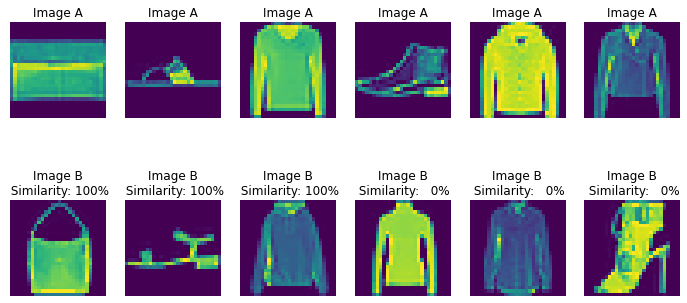

In [ ]:
pv_a, pv_b, pv_sim = gen_random_batch(train_groups, 3)
fig, m_axs = plt.subplots(2, pv_a.shape[0], figsize=(12, 6))
for c_a, c_b, c_d, (ax1, ax2) in zip(pv_a, pv_b, pv_sim, m_axs.T):
    ax1.imshow(c_a[:, :, 0])
    ax1.set_title('Image A')
    ax1.axis('off')
    ax2.imshow(c_b[:, :, 0])
    ax2.set_title('Image B\n Similarity: %3.0f%%' % (100 * c_d))
    ax2.axis('off')

In [ ]:
img_in = Input(shape=x_train.shape[1:], name='FeatureNet_ImageInput')
n_layer = img_in
for i in range(2):
    n_layer = Conv2D(8 * 2 ** i, kernel_size=(3, 3), activation='linear')(n_layer)
    n_layer = BatchNormalization()(n_layer)
    n_layer = Activation('relu')(n_layer)
    n_layer = Conv2D(16 * 2 ** i, kernel_size=(3, 3), activation='linear')(n_layer)
    n_layer = BatchNormalization()(n_layer)
    n_layer = Activation('relu')(n_layer)
    n_layer = MaxPool2D((2, 2))(n_layer)
n_layer = Flatten()(n_layer)
n_layer = Dense(32, activation='linear')(n_layer)
n_layer = Dropout(0.5)(n_layer)
n_layer = BatchNormalization()(n_layer)
n_layer = Activation('relu')(n_layer)
feature_model = Model(inputs=[img_in], outputs=[n_layer], name='FeatureGenerationModel')
feature_model.summary()

# feature_model.predict(x_train[:10])

Model: "FeatureGenerationModel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 FeatureNet_ImageInput (Inpu  [(None, 28, 28, 1)]      0         
 tLayer)                                                         
                                                                 
 conv2d (Conv2D)             (None, 26, 26, 8)         80        
                                                                 
 batch_normalization (BatchN  (None, 26, 26, 8)        32        
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 26, 26, 8)         0         
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 16)        1168      
                                                                 
 batch_normalization_1 (Batc  (None, 24, 24,

In [ ]:
img_a_in = Input(shape=x_train.shape[1:], name='ImageA_Input')
img_b_in = Input(shape=x_train.shape[1:], name='ImageB_Input')

img_a_feat = feature_model(img_a_in)
img_b_feat = feature_model(img_b_in)

combined_features = concatenate([img_a_feat, img_b_feat], name='merge_features')
combined_features = Dense(16, activation='linear')(combined_features)
combined_features = BatchNormalization()(combined_features)
combined_features = Activation('relu')(combined_features)
combined_features = Dense(4, activation='linear')(combined_features)
combined_features = BatchNormalization()(combined_features)
combined_features = Activation('relu')(combined_features)
combined_features = Dense(1, activation='sigmoid')(combined_features)

similarity_model = Model(inputs=[img_a_in, img_b_in], outputs=[combined_features], name='Similarity_Model')

similarity_model.summary()

Model: "Similarity_Model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 ImageA_Input (InputLayer)      [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 ImageB_Input (InputLayer)      [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 FeatureGenerationModel (Functi  (None, 32)          25040       ['ImageA_Input[0][0]',           
 onal)                                                            'ImageB_Input[0][0]']           
                                                                                                  
 merge_features (Concatenate)   (None, 64)           0           ['FeatureGeneratio

In [ ]:
similarity_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mae'])

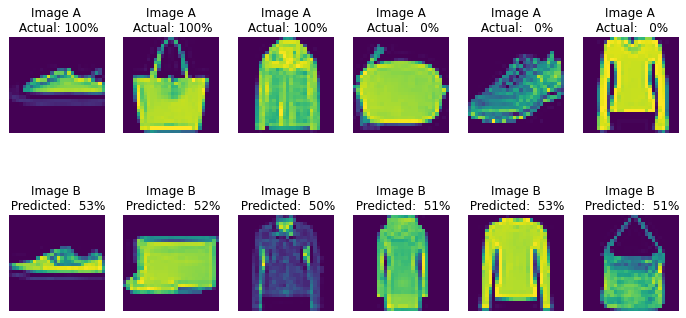

In [ ]:
def show_model_output(nb_examples=3, nn_model=similarity_model, t_groups=test_groups):
    pv_a, pv_b, pv_sim = gen_random_batch(t_groups, nb_examples)
    pred_sim = nn_model.predict([pv_a, pv_b])
    fig, m_axs = plt.subplots(2, pv_a.shape[0], figsize=(12, 6))
    for c_a, c_b, c_d, p_d, (ax1, ax2) in zip(pv_a, pv_b, pv_sim, pred_sim, m_axs.T):
        ax1.imshow(c_a[:, :, 0])
        ax1.set_title('Image A\n Actual: %3.0f%%' % (100 * c_d))
        ax1.axis('off')
        ax2.imshow(c_b[:, :, 0])
        ax2.set_title('Image B\n Predicted: %3.0f%%' % (100 * p_d))
        ax2.axis('off')
    return fig


# a completely untrained model
_ = show_model_output()

In [ ]:
# make a generator out of the data
def siam_gen(in_groups, batch_size=32, t_groups=train_groups):
    while True:
        pv_a, pv_b, pv_sim = gen_random_batch(t_groups, batch_size // 2)
        yield [pv_a, pv_b], pv_sim

In [ ]:
similarity_model.load_weights('example_sim_ckpt')

In [ ]:
# we want a constant validation group to have a frame of reference for model performance
valid_a, valid_b, valid_sim = gen_random_batch(test_groups, 1024)
loss_history = similarity_model.fit_generator(siam_gen(train_groups),
                                              steps_per_epoch=500,
                                              validation_data=([valid_a, valid_b], valid_sim),
                                              epochs=10,
                                              verbose=True)

Epoch 1/10


C:\Users\andys\AppData\Local\Temp\ipykernel_20412\4015093368.py:10: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  loss_history = similarity_model.fit_generator(siam_gen(train_groups),


500/500 [==============================] - 14s 27ms/step - loss: 0.3751 - mae: 0.2442 - val_loss: 0.3281 - val_mae: 0.2011
Epoch 2/10
500/500 [==============================] - 14s 27ms/step - loss: 0.3639 - mae: 0.2344 - val_loss: 0.3212 - val_mae: 0.1972
Epoch 3/10
500/500 [==============================] - 13s 27ms/step - loss: 0.3637 - mae: 0.2345 - val_loss: 0.3161 - val_mae: 0.1947
Epoch 4/10
500/500 [==============================] - 13s 26ms/step - loss: 0.3518 - mae: 0.2265 - val_loss: 0.3209 - val_mae: 0.1934
Epoch 5/10
500/500 [==============================] - 13s 26ms/step - loss: 0.3511 - mae: 0.2240 - val_loss: 0.3103 - val_mae: 0.1859
Epoch 6/10
500/500 [==============================] - 13s 26ms/step - loss: 0.3463 - mae: 0.2210 - val_loss: 0.3179 - val_mae: 0.1859
Epoch 7/10
500/500 [==============================] - 13s 26ms/step - loss: 0.3464 - mae: 0.2200 - val_loss: 0.3239 - val_mae: 0.1895
Epoch 8/10
500/500 [==============================] - 13s 27ms/step - los

In [ ]:
similarity_model.save_weights('example_sim_ckpt')

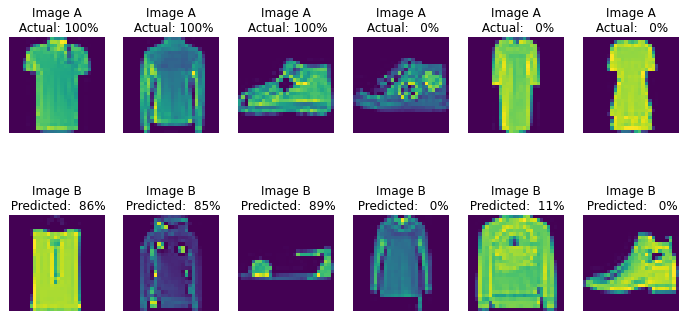

In [ ]:
_ = show_model_output()

In [ ]:
t_shirt_vec = np.stack([train_groups[0][0]] * x_test.shape[0], 0)
t_shirt_score = similarity_model.predict([t_shirt_vec, x_test], verbose=True, batch_size=128)
ankle_boot_vec = np.stack([train_groups[-1][0]] * x_test.shape[0], 0)
ankle_boot_score = similarity_model.predict([ankle_boot_vec, x_test], verbose=True, batch_size=128)

141/141 [==============================] - 1s 4ms/step


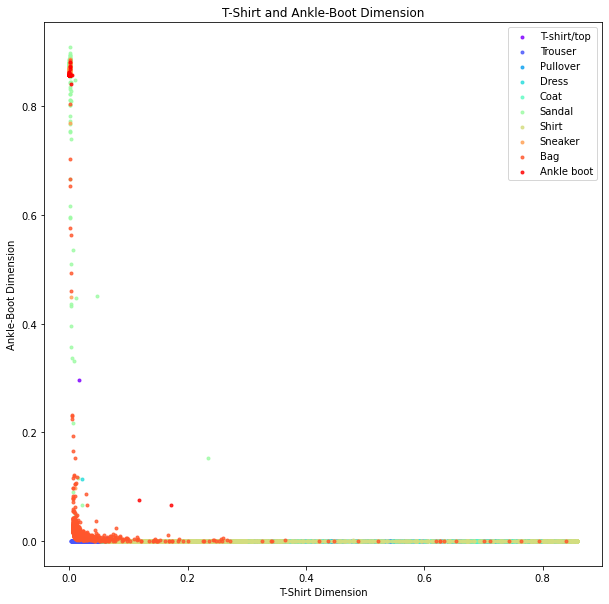

In [ ]:
plt.figure(figsize=(10, 10))

for c_group, (c_color, c_label) in enumerate(zip(colors, obj_categories)):
    plt.scatter(t_shirt_score[np.where(y_test == c_group), 0],
                ankle_boot_score[np.where(y_test == c_group), 0],
                marker='.',
                color=c_color,
                linewidth=1,
                alpha=0.8,
                label=c_label)
plt.xlabel('T-Shirt Dimension')
plt.ylabel('Ankle-Boot Dimension')
plt.title('T-Shirt and Ankle-Boot Dimension')
plt.legend(loc='best')
plt.savefig('tshirt-boot-dist.png')
plt.show(block=False)

In [ ]:
x_test_features = feature_model.predict(x_test, verbose=True, batch_size=128)

141/141 [==============================] - 0s 3ms/step


In [ ]:
%%time

tsne_obj = TSNE(n_components=2,
                init='pca',
                random_state=101,
                method='barnes_hut',
                n_iter=500,
                verbose=2)
tsne_features = tsne_obj.fit_transform(x_test_features)

G:\Programming\python2022\venv\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 18000 samples in 0.000s...
[t-SNE] Computed neighbors for 18000 samples in 6.415s...
[t-SNE] Computed conditional probabilities for sample 1000 / 18000
[t-SNE] Computed conditional probabilities for sample 2000 / 18000
[t-SNE] Computed conditional probabilities for sample 3000 / 18000
[t-SNE] Computed conditional probabilities for sample 4000 / 18000
[t-SNE] Computed conditional probabilities for sample 5000 / 18000
[t-SNE] Computed conditional probabilities for sample 6000 / 18000
[t-SNE] Computed conditional probabilities for sample 7000 / 18000
[t-SNE] Computed conditional probabilities for sample 8000 / 18000
[t-SNE] Computed conditional probabilities for sample 9000 / 18000
[t-SNE] Computed conditional probabilities for sample 10000 / 18000
[t-SNE] Computed conditional probabilities for sample 11000 / 18000
[t-SNE] Computed conditional probabilities for sample 12000 / 18000
[t-SNE] Computed conditional probabilities for sam

G:\Programming\python2022\venv\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] Iteration 50: error = 82.9223022, gradient norm = 0.0021908 (50 iterations in 2.579s)
[t-SNE] Iteration 100: error = 80.4139404, gradient norm = 0.0011603 (50 iterations in 2.328s)
[t-SNE] Iteration 150: error = 79.3802032, gradient norm = 0.0007603 (50 iterations in 2.391s)
[t-SNE] Iteration 200: error = 78.8286743, gradient norm = 0.0005790 (50 iterations in 2.344s)
[t-SNE] Iteration 250: error = 78.4851913, gradient norm = 0.0004689 (50 iterations in 2.281s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.485191
[t-SNE] Iteration 300: error = 3.2317908, gradient norm = 0.0012172 (50 iterations in 2.328s)
[t-SNE] Iteration 350: error = 2.7203071, gradient norm = 0.0006337 (50 iterations in 2.359s)
[t-SNE] Iteration 400: error = 2.4166028, gradient norm = 0.0003993 (50 iterations in 2.297s)
[t-SNE] Iteration 450: error = 2.2231929, gradient norm = 0.0002823 (50 iterations in 2.382s)
[t-SNE] Iteration 500: error = 2.0889392, gradient norm = 0.0002127 (50 

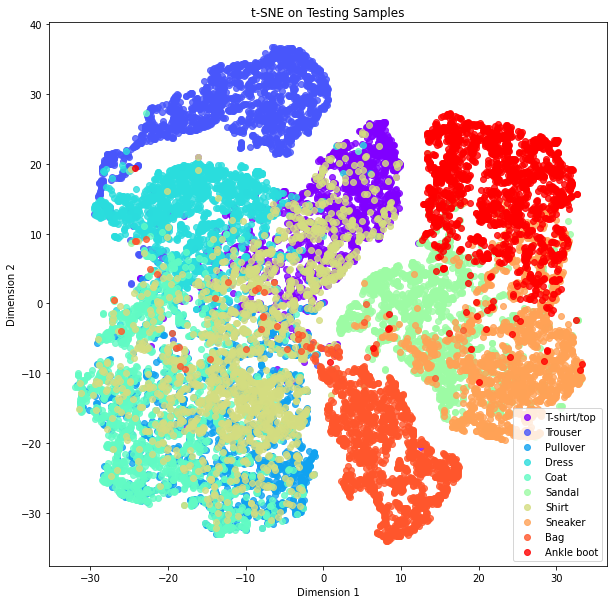

In [ ]:
plt.figure(figsize=(10, 10))
for c_group, (c_color, c_label) in enumerate(zip(colors, obj_categories)):
    plt.scatter(tsne_features[np.where(y_test == c_group), 0],
                tsne_features[np.where(y_test == c_group), 1],
                marker='o',
                color=c_color,
                linewidth=1,
                alpha=0.8,
                label=c_label)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('t-SNE on Testing Samples')
plt.legend(loc='best')
plt.savefig('clothes-dist.png')
plt.show(block=False)

In [ ]:
input_tensor = Input(shape=(28, 28, 3))
input_tensor = Resizing(height=96, width=96)(input_tensor)

base_model = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=False)
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 28, 28, 3)]  0           []                               
                                                                                                  
 resizing (Resizing)            (None, 96, 96, 3)    0           ['input_1[0][0]']                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 47, 47, 32)   864         ['resizing[0][0]']               
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 47, 47, 32)  96          ['conv2d_4[0][0]']               
 rmalization)                                                                          

In [ ]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)

model = Model(inputs=base_model.input, outputs=x)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 28, 28, 3)]  0           []                               
                                                                                                  
 resizing (Resizing)            (None, 96, 96, 3)    0           ['input_1[0][0]']                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 47, 47, 32)   864         ['resizing[0][0]']               
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 47, 47, 32)  96          ['conv2d_4[0][0]']               
 rmalization)                                                                                 

In [ ]:
%%time
x_train_3 = []
for im in tqdm(x_train):
    x_train_3.append(merge((im,im,im)))
x_train_3 = np.array(x_train_3)

x_test_3 = []
for im in tqdm(x_test):
    x_test_3.append(merge((im,im,im)))
x_test_3 = np.array(x_test_3)

train_groups_3 = [x_train_3[np.where(y_train == i)[0]] for i in np.unique(y_train)]
test_groups_3 = [x_test_3[np.where(y_test == i)[0]] for i in np.unique(y_train)]

# model.predict(x_train_3[:10])

100%|██████████| 18000/18000 [00:00<00:00, 75433.28it/s]


CPU times: total: 984 ms
Wall time: 1.06 s


In [ ]:
img_a_in = Input(shape=x_train_3.shape[1:], name = 'ImageA_Input')
img_b_in = Input(shape=x_train_3.shape[1:], name = 'ImageB_Input')

img_a_feat = model(img_a_in)
img_b_feat = model(img_b_in)

combined_features = concatenate([img_a_feat, img_b_feat], name = 'merge_features')

combined_features = Dense(16, activation = 'linear')(combined_features)
combined_features = BatchNormalization()(combined_features)
combined_features = Activation('relu')(combined_features)
combined_features = Dense(4, activation = 'linear')(combined_features)
combined_features = BatchNormalization()(combined_features)
combined_features = Activation('relu')(combined_features)
combined_features = Dense(1, activation = 'sigmoid')(combined_features)

similarity_model2 = Model(inputs = [img_a_in, img_b_in], outputs = [combined_features], name = 'Similarity_Model')
similarity_model2.summary()

# similarity_model2.predict([x_train_3[:10], x_train_3[:10]])

Model: "Similarity_Model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 ImageA_Input (InputLayer)      [(None, 28, 28, 3)]  0           []                               
                                                                                                  
 ImageB_Input (InputLayer)      [(None, 28, 28, 3)]  0           []                               
                                                                                                  
 model (Functional)             (None, 512)          22851872    ['ImageA_Input[0][0]',           
                                                                  'ImageB_Input[0][0]']           
                                                                                                  
 merge_features (Concatenate)   (None, 1024)         0           ['model[0][0]',   

In [ ]:
similarity_model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mae'])

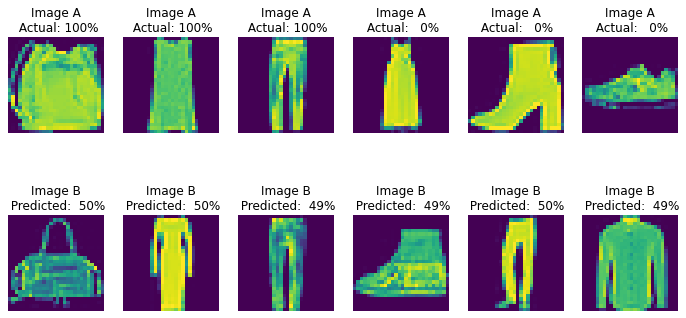

In [ ]:
_ = show_model_output(nn_model=similarity_model2, t_groups=test_groups_3)

In [ ]:
similarity_model2.load_weights("my_sim_ckpt")

In [ ]:
valid_a, valid_b, valid_sim = gen_random_batch(test_groups_3, 1024)
loss_history = similarity_model2.fit_generator(siam_gen(train_groups_3, t_groups=train_groups_3),
                                               steps_per_epoch=500,
                                               validation_data=([valid_a, valid_b], valid_sim),
                                               epochs=10,
                                               verbose=True)

Epoch 1/10


C:\Users\andys\AppData\Local\Temp\ipykernel_20412\1814382559.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  loss_history = similarity_model2.fit_generator(siam_gen(train_groups_3, t_groups=train_groups_3),


500/500 [==============================] - 68s 114ms/step - loss: 0.5481 - mae: 0.3854 - val_loss: 0.5588 - val_mae: 0.2761
Epoch 2/10
500/500 [==============================] - 54s 108ms/step - loss: 0.4400 - mae: 0.3005 - val_loss: 0.5219 - val_mae: 0.3109
Epoch 3/10
500/500 [==============================] - 52s 105ms/step - loss: 0.3967 - mae: 0.2681 - val_loss: 0.3742 - val_mae: 0.2502
Epoch 4/10
500/500 [==============================] - 51s 102ms/step - loss: 0.3629 - mae: 0.2378 - val_loss: 0.3581 - val_mae: 0.2362
Epoch 5/10
500/500 [==============================] - 52s 104ms/step - loss: 0.3434 - mae: 0.2208 - val_loss: 0.3719 - val_mae: 0.2303
Epoch 6/10
500/500 [==============================] - 53s 107ms/step - loss: 0.3246 - mae: 0.2067 - val_loss: 0.2962 - val_mae: 0.1888
Epoch 7/10
500/500 [==============================] - 52s 103ms/step - loss: 0.2897 - mae: 0.1829 - val_loss: 0.2787 - val_mae: 0.1721
Epoch 8/10
500/500 [==============================] - 52s 104ms/st

In [ ]:
similarity_model2.save_weights("my_sim_ckpt")

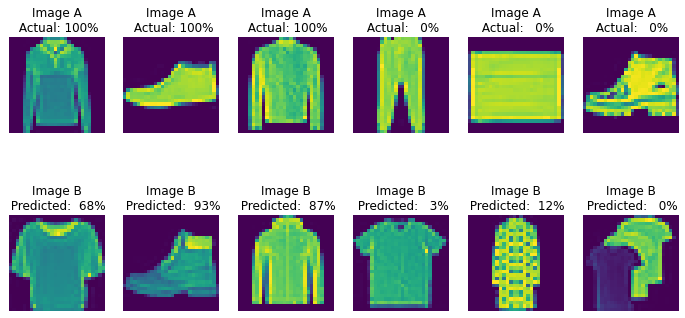

In [ ]:
_ = show_model_output(nn_model=similarity_model2, t_groups=test_groups_3)

In [ ]:
x_test_features_3 = base_model.predict(x_test_3, verbose=True, batch_size=128)

print(x_test_features.shape, x_test_features_3.shape)

x_test_features_3 = x_test_features_3.reshape((18000, 2048))

141/141 [==============================] - 6s 27ms/step
(18000, 32) (18000, 1, 1, 2048)


In [ ]:
%%time
tsne_obj = TSNE(n_components=2,
                init='pca',
                random_state=101,
                method='barnes_hut',
                n_iter=500,
                verbose=2)
tsne_features_2d = tsne_obj.fit_transform(x_test_features_3)

G:\Programming\python2022\venv\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 18000 samples in 0.016s...
[t-SNE] Computed neighbors for 18000 samples in 14.695s...
[t-SNE] Computed conditional probabilities for sample 1000 / 18000
[t-SNE] Computed conditional probabilities for sample 2000 / 18000
[t-SNE] Computed conditional probabilities for sample 3000 / 18000
[t-SNE] Computed conditional probabilities for sample 4000 / 18000
[t-SNE] Computed conditional probabilities for sample 5000 / 18000
[t-SNE] Computed conditional probabilities for sample 6000 / 18000
[t-SNE] Computed conditional probabilities for sample 7000 / 18000
[t-SNE] Computed conditional probabilities for sample 8000 / 18000
[t-SNE] Computed conditional probabilities for sample 9000 / 18000
[t-SNE] Computed conditional probabilities for sample 10000 / 18000
[t-SNE] Computed conditional probabilities for sample 11000 / 18000
[t-SNE] Computed conditional probabilities for sample 12000 / 18000
[t-SNE] Computed conditional probabilities for sa

G:\Programming\python2022\venv\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] Iteration 50: error = 70.4918594, gradient norm = 0.0029319 (50 iterations in 2.281s)
[t-SNE] Iteration 100: error = 67.6199799, gradient norm = 0.0018713 (50 iterations in 2.266s)
[t-SNE] Iteration 150: error = 66.4850922, gradient norm = 0.0011861 (50 iterations in 2.297s)
[t-SNE] Iteration 200: error = 65.7316360, gradient norm = 0.0011057 (50 iterations in 2.203s)
[t-SNE] Iteration 250: error = 65.2543030, gradient norm = 0.0008637 (50 iterations in 2.328s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.254303
[t-SNE] Iteration 300: error = 2.3834057, gradient norm = 0.0010602 (50 iterations in 2.406s)
[t-SNE] Iteration 350: error = 1.9860958, gradient norm = 0.0005741 (50 iterations in 2.220s)
[t-SNE] Iteration 400: error = 1.7446493, gradient norm = 0.0003723 (50 iterations in 2.234s)
[t-SNE] Iteration 450: error = 1.5814009, gradient norm = 0.0002837 (50 iterations in 2.305s)
[t-SNE] Iteration 500: error = 1.4589318, gradient norm = 0.0002187 (50 

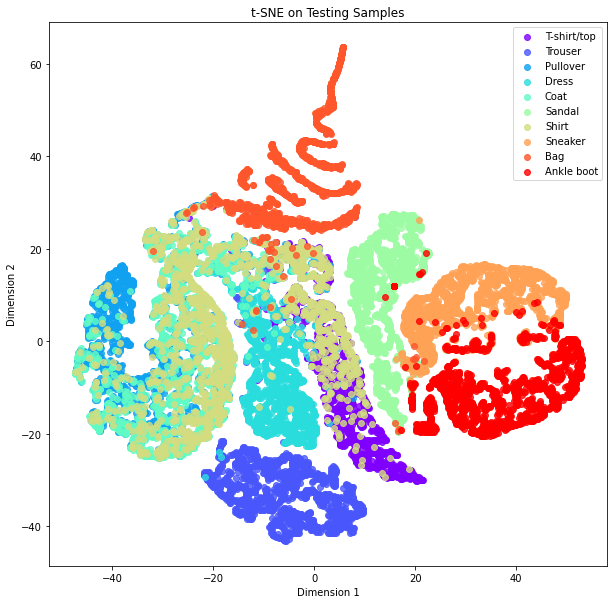

In [ ]:
plt.figure(figsize=(10, 10))
for c_group, (c_color, c_label) in enumerate(zip(colors, obj_categories)):
    plt.scatter(tsne_features_2d[np.where(y_test == c_group), 0],
                tsne_features_2d[np.where(y_test == c_group), 1],
                marker='o',
                color=c_color,
                linewidth=1,
                alpha=0.8,
                label=c_label)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('t-SNE on Testing Samples')
plt.legend(loc='best')
plt.savefig('clothes-dist.png')
plt.show(block=False)

In [ ]:
fig = px.scatter(
    tsne_features_2d, x=0, y=1,
    color=y_test.reshape(18000), labels={'color': 'clothes'}
)
fig.show()

In [ ]:
%%time
tsne_obj = TSNE(n_components=3,
                init='pca',
                random_state=101,
                method='barnes_hut',
                n_iter=500,
                verbose=2)
tsne_features_3d = tsne_obj.fit_transform(x_test_features_3)

G:\Programming\python2022\venv\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 18000 samples in 0.027s...
[t-SNE] Computed neighbors for 18000 samples in 14.643s...
[t-SNE] Computed conditional probabilities for sample 1000 / 18000
[t-SNE] Computed conditional probabilities for sample 2000 / 18000
[t-SNE] Computed conditional probabilities for sample 3000 / 18000
[t-SNE] Computed conditional probabilities for sample 4000 / 18000
[t-SNE] Computed conditional probabilities for sample 5000 / 18000
[t-SNE] Computed conditional probabilities for sample 6000 / 18000
[t-SNE] Computed conditional probabilities for sample 7000 / 18000
[t-SNE] Computed conditional probabilities for sample 8000 / 18000
[t-SNE] Computed conditional probabilities for sample 9000 / 18000
[t-SNE] Computed conditional probabilities for sample 10000 / 18000
[t-SNE] Computed conditional probabilities for sample 11000 / 18000
[t-SNE] Computed conditional probabilities for sample 12000 / 18000
[t-SNE] Computed conditional probabilities for sa

G:\Programming\python2022\venv\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



[t-SNE] Iteration 50: error = 65.8967819, gradient norm = 0.0022826 (50 iterations in 5.204s)
[t-SNE] Iteration 100: error = 64.2255859, gradient norm = 0.0010854 (50 iterations in 4.924s)
[t-SNE] Iteration 150: error = 63.8772125, gradient norm = 0.0005458 (50 iterations in 4.773s)
[t-SNE] Iteration 200: error = 63.5819092, gradient norm = 0.0006174 (50 iterations in 4.762s)
[t-SNE] Iteration 250: error = 63.4856186, gradient norm = 0.0005782 (50 iterations in 4.868s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.485619
[t-SNE] Iteration 300: error = 1.8705952, gradient norm = 0.0007343 (50 iterations in 5.373s)
[t-SNE] Iteration 350: error = 1.4360886, gradient norm = 0.0002949 (50 iterations in 5.625s)
[t-SNE] Iteration 400: error = 1.2204777, gradient norm = 0.0001612 (50 iterations in 5.500s)
[t-SNE] Iteration 450: error = 1.0910699, gradient norm = 0.0001021 (50 iterations in 5.609s)
[t-SNE] Iteration 500: error = 1.0071555, gradient norm = 0.0000727 (50 

In [ ]:
fig2 = px.scatter_3d(
    tsne_features_3d, x=0, y=1, z=2,
    color=y_test.reshape(18000), labels={'color': 'clothes'},
)
fig2.update_traces(marker_size=8)
fig2.show()